<a href="https://colab.research.google.com/github/montesinos8/TFM_48763797W_Predicci-n-de-accidentes-en-el-rea-Metropolitana-de-Madrid/blob/main/FORECASTING_LGBM_HORAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install darts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.2/934.2 kB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.7/314.7 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.4/271.4 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 890.6/890.6 kB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.8 MB/s eta 0:00:

In [ ]:
pip install skforecast

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.5/670.5 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.2 MB/s eta 0:00:00


In [ ]:
pip install astral

In [ ]:
pip install plotly

In [ ]:
import pandas as pd
import os
import re
import numpy as np


from statsmodels.tsa.stattools import adfuller, kpss
import warnings
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot

import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from skforecast.plot import plot_residuals
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as poff

plt.style.use('seaborn-v0_8')
#plt.style.use('ggplot')

from astral import LocationInfo
from astral.sun import sun


import skforecast
import lightgbm
import sklearn
from lightgbm import LGBMRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFECV
from skforecast.ForecasterBaseline import ForecasterEquivalentDate
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.model_selection import bayesian_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.model_selection import select_features

import warnings
warnings.filterwarnings('once')
warnings.filterwarnings('ignore')


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning:


Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.




In [ ]:
file_path = '/content/drive/My Drive/TFM/csv_tfm/ACCIDENTES_H_DB.csv'

accidentes_df= pd.read_csv(file_path, sep=',')
accidentes_df =accidentes_df.sort_values(by='FECHA')
accidentes_df

,FECHA,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
0,2010-01-01 00:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
1,2010-01-01 02:00:00,8,5.566667,0.05,18.233333,1,0,0,0,4307658.0
2,2010-01-01 04:00:00,2,5.566667,0.05,18.233333,1,0,0,0,4307658.0
3,2010-01-01 08:00:00,11,5.566667,0.05,18.233333,1,0,0,0,4307658.0
4,2010-01-01 10:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
...,...,...,...,...,...,...,...,...,...,...
66813,2023-12-31 18:00:00,5,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66814,2023-12-31 19:00:00,13,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66815,2023-12-31 20:00:00,9,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66816,2023-12-31 21:00:00,8,7.050000,0.00,9.675000,0,0,0,0,5400000.0


In [ ]:
accidentes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66818 entries, 0 to 66817
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   FECHA                    66818 non-null  object 
 1   NUM_ACCIDENTES           66818 non-null  int64  
 2   TMEDIA                   66818 non-null  float64
 3   PRECIPITACION            66818 non-null  float64
 4   RACHA                    66818 non-null  float64
 5   FESTIVO                  66818 non-null  int64  
 6   CONFINAMIENTO            66818 non-null  int64  
 7   RESTRICCION_HORARIA      66818 non-null  int64  
 8   RESTRICCION_TERRITORIAL  66818 non-null  int64  
 9   NUM_VEHICULOS            66818 non-null  float64
dtypes: float64(4), int64(5), object(1)
memory usage: 5.1+ MB


In [ ]:
accidentes_df['FECHA'] = pd.to_datetime(accidentes_df['FECHA'])
accidentes_df.set_index('FECHA', inplace=True)
accidentes_df=accidentes_df.asfreq('h')
accidentes_df=accidentes_df.sort_index()
accidentes_df




,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
FECHA,,,,,,,,,
2010-01-01 00:00:00,3.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 02:00:00,8.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 04:00:00,2.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,5.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 19:00:00,13.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 20:00:00,9.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0


In [ ]:

accidentes_df.index = pd.to_datetime(accidentes_df.index)

# Agrupar por día y obtener el valor máximo de las variables binarias para el día completo
binary_daily_max = accidentes_df.groupby(accidentes_df.index.date).agg({
    'FESTIVO': 'max',
    'CONFINAMIENTO': 'max',
    'RESTRICCION_HORARIA': 'max',
    'RESTRICCION_TERRITORIAL': 'max',
    'NUM_VEHICULOS': 'max'
}).reset_index()

binary_daily_max.rename(columns={'index': 'FECHA_SOLO'}, inplace=True)

accidentes_df['FECHA_SOLO'] = accidentes_df.index.date

accidentes_df['FECHA'] = accidentes_df.index

accidentes_df = pd.merge(accidentes_df, binary_daily_max, left_on='FECHA_SOLO', right_on='FECHA_SOLO', how='left', suffixes=('', '_max'))

accidentes_df['FESTIVO'].fillna(accidentes_df['FESTIVO_max'], inplace=True)
accidentes_df['CONFINAMIENTO'].fillna(accidentes_df['CONFINAMIENTO_max'], inplace=True)
accidentes_df['RESTRICCION_HORARIA'].fillna(accidentes_df['RESTRICCION_HORARIA_max'], inplace=True)
accidentes_df['RESTRICCION_TERRITORIAL'].fillna(accidentes_df['RESTRICCION_TERRITORIAL_max'], inplace=True)
accidentes_df['NUM_VEHICULOS'].fillna(accidentes_df['NUM_VEHICULOS_max'], inplace=True)
accidentes_df.drop(columns=['FESTIVO_max', 'CONFINAMIENTO_max', 'RESTRICCION_HORARIA_max', 'RESTRICCION_TERRITORIAL_max', 'FECHA_SOLO', 'NUM_VEHICULOS_max'], inplace=True)
accidentes_df.set_index('FECHA', inplace=True)

accidentes_df.fillna(0, inplace=True)

print(accidentes_df.head())


                     NUM_ACCIDENTES    TMEDIA  PRECIPITACION      RACHA  \
FECHA                                                                     
2010-01-01 00:00:00             3.0  5.566667           0.05  18.233333   
2010-01-01 01:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 02:00:00             8.0  5.566667           0.05  18.233333   
2010-01-01 03:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 04:00:00             2.0  5.566667           0.05  18.233333   

                     FESTIVO  CONFINAMIENTO  RESTRICCION_HORARIA  \
FECHA                                                              
2010-01-01 00:00:00      1.0            0.0                  0.0   
2010-01-01 01:00:00      1.0            0.0                  0.0   
2010-01-01 02:00:00      1.0            0.0                  0.0   
2010-01-01 03:00:00      1.0            0.0                  0.0   
2010-01-01 04:00:00      1.0            0.0                  0.0  

In [ ]:
accidentes_df=accidentes_df.asfreq('h')

In [ ]:
print(f"Tipo de índice: {accidentes_df.index.dtype}")
print(f"Frecuencia: {accidentes_df.index.freq}")

Tipo de índice: datetime64[ns]
Frecuencia: <Hour>


verificar si esta la serie completa

In [ ]:
fecha_inicio = accidentes_df.index.min()
fecha_fin = accidentes_df.index.max()
date_range_completo = pd.date_range(start=fecha_inicio, end=fecha_fin, freq=accidentes_df.index.freq)
print(f"Índice completo: {(accidentes_df.index == date_range_completo).all()}")
print(f"Filas con valores ausentes: {accidentes_df.isnull().any(axis=1).mean()}")


Índice completo: True
Filas con valores ausentes: 0.0


## Estudio de datos serie completa

In [ ]:
accidentes_df['Año'] = accidentes_df.index.year
media_anual = accidentes_df.groupby('Año')['NUM_ACCIDENTES'].mean()
print(media_anual)


Año
2010    3.029680
2011    3.120662
2012    3.069217
2013    3.066781
2014    3.192580
2015    3.213699
2016    3.327300
2017    3.402740
2018    3.436073
2019    5.919292
2020    3.692281
2021    4.769749
2022    5.371347
2023    5.574837
Name: NUM_ACCIDENTES, dtype: float64


In [ ]:
# Media de accidentes por día de la semana
accidentes_df['Dia_Semana'] = accidentes_df.index.dayofweek + 1
media_dia_semana = accidentes_df.groupby('Dia_Semana')['NUM_ACCIDENTES'].mean()
print("Media de accidentes por día de la semana:")
print(media_dia_semana)

# Media de accidentes por mes
accidentes_df['Mes'] = accidentes_df.index.month
media_mes = accidentes_df.groupby('Mes')['NUM_ACCIDENTES'].mean()
print("\nMedia de accidentes por mes:")
print(media_mes)


Media de accidentes por día de la semana:
Dia_Semana
1    3.362386
2    3.920776
3    4.055308
4    4.126598
5    4.407547
6    4.007809
7    3.210454
Name: NUM_ACCIDENTES, dtype: float64

Media de accidentes por mes:
Mes
1     3.604647
2     4.091878
3     3.761137
4     3.559325
5     3.927419
6     4.212004
7     3.681740
8     2.511425
9     3.978770
10    4.447485
11    4.424107
12    4.284013
Name: NUM_ACCIDENTES, dtype: float64


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=accidentes_df.index, y=accidentes_df['NUM_ACCIDENTES'], mode='lines', name='Accidentes'))
fig.update_layout(title='Número de Accidentes Diarios', xaxis_title='Fecha', yaxis_title='Número de Accidentes')
fig.show()


In [ ]:
accidentes_df = accidentes_df.copy()

accidentes_df = accidentes_df.loc['2010-01-01 00:00:00': '2023-12-31 23:59:59'].copy()

fin_train = '2019-12-31 23:59:59'
ini_val = '2020-01-01 00:00:00'
fin_val = '2022-12-31 23:59:59'
ini_test = '2023-01-01 00:00:00'

# Crear los subconjuntos para cada fase (train, val, test)
accidentes_df_train = accidentes_df.loc[:fin_train].copy()
accidentes_df_val   = accidentes_df.loc[ini_val:fin_val].copy()
accidentes_df_test  = accidentes_df.loc[ini_test:].copy()

print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=accidentes_df_train.index, y=accidentes_df_train['NUM_ACCIDENTES'], mode='lines', name='Train'))
fig.add_trace(go.Scatter(x=accidentes_df_val.index, y=accidentes_df_val['NUM_ACCIDENTES'], mode='lines', name='Validation'))
fig.add_trace(go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], mode='lines', name='Test'))
fig.update_layout(
    title  = 'Número de Accidentes Diarios',
    xaxis_title='Fecha',
    yaxis_title='Número de Accidentes',
    legend_title="Partición:",
    width=850,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)

fig.show()

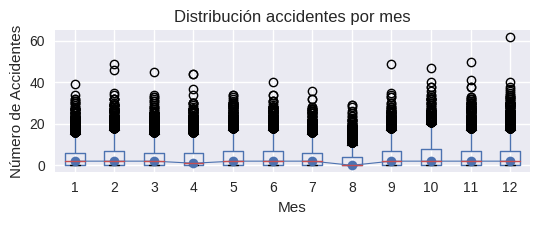

In [ ]:
# Distribución de la demanda por mes
fig, ax = plt.subplots(figsize=(5.5, 2.5))
accidentes_df['mes'] = accidentes_df.index.month
accidentes_df.boxplot(column='NUM_ACCIDENTES', by='mes', ax=ax,)
accidentes_df.groupby('mes')['NUM_ACCIDENTES'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Número de Accidentes')
ax.set_title('Distribución accidentes por mes')
ax.set_xlabel('Mes')
plt.suptitle("")
plt.tight_layout()
plt.show()


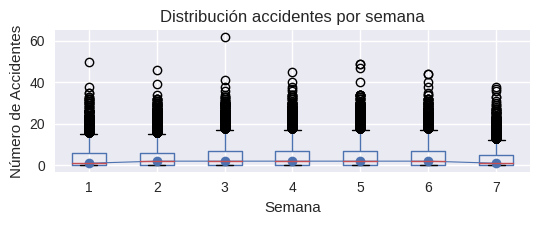

In [ ]:
# Distribución de la demanda por semana
fig, ax = plt.subplots(figsize=(5.5, 2.5))
accidentes_df['semana'] = accidentes_df.index.day_of_week + 1
accidentes_df.boxplot(column='NUM_ACCIDENTES', by='semana', ax=ax,)
accidentes_df.groupby('semana')['NUM_ACCIDENTES'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Número de Accidentes')
ax.set_title('Distribución accidentes por semana')
ax.set_xlabel('Semana')
plt.suptitle("")
plt.tight_layout()
plt.show()


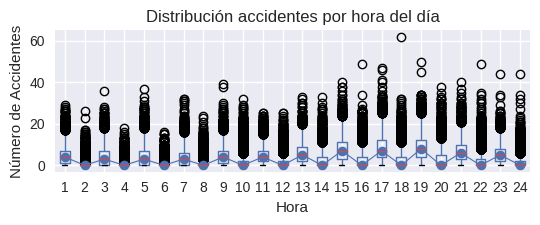

In [ ]:
fig, ax = plt.subplots(figsize=(5.5, 2.5))
accidentes_df['hora'] = accidentes_df.index.hour +1
accidentes_df.boxplot(column='NUM_ACCIDENTES', by='hora', ax=ax,)
accidentes_df.groupby('hora')['NUM_ACCIDENTES'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('Número de Accidentes')
ax.set_title('Distribución accidentes por hora del día')
ax.set_xlabel('Hora')
plt.suptitle("")
plt.tight_layout()
plt.show()


## Gráficos de autocorrelación

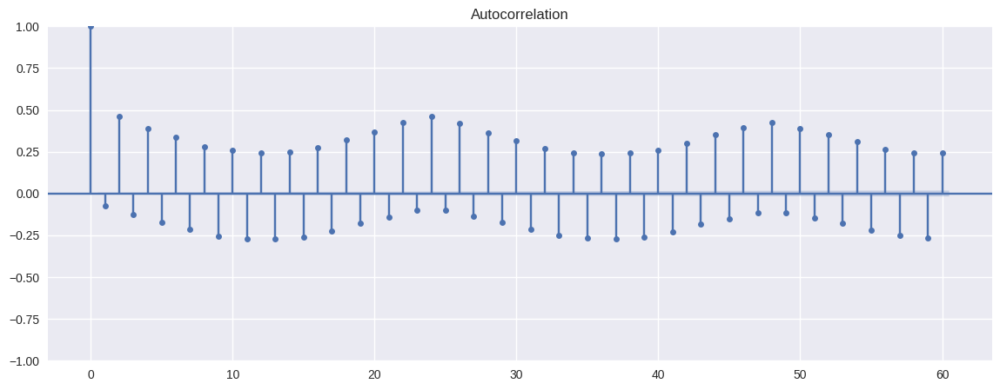

In [ ]:
# Gráfico autocorrelación
fig, ax = plt.subplots(figsize=(14, 5))
plot_acf(accidentes_df.NUM_ACCIDENTES, ax=ax, lags=60)
plt.show()


*   primer valor alto y despues desciende, por lo que el valor anterior tiene influencia directa con el siguiente.
*   se ve estacionalidad semanal, coincide el punto mas alto
*   todos los valores fuera dek intervalo de confianza por lo que son fiables estadisticamente hablando.




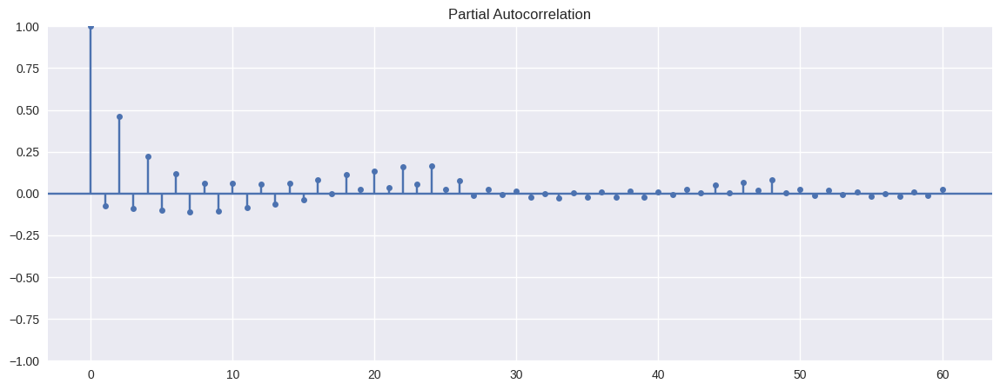

In [ ]:
# Gráfico autocorrelación
fig, ax = plt.subplots(figsize=(14, 5))
plot_pacf(accidentes_df.NUM_ACCIDENTES, ax=ax, lags=60)
plt.show()

*   primer valor alto y despues desciende, por lo que el valor anterior tiene influencia directa con el siguiente.
*   despues de los primeros dias disminuye mucho, por lo que pierrde la influencia directa totalmente
*  algunos valores dentro dek intervalo de confianza.


#**Baseline**

In [ ]:
forecaster = ForecasterEquivalentDate(
                 offset    = pd.DateOffset(days=1),
                 n_offsets = 1
             )

forecaster.fit(y=accidentes_df.loc[:fin_val, 'NUM_ACCIDENTES'])
forecaster

ForecasterEquivalentDate 
Offset: <DateOffset: days=1> 
Number of offsets: 1 
Aggregation function: mean 
Window size: 24 
Training range: [Timestamp('2010-01-01 00:00:00'), Timestamp('2022-12-31 23:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: h 
Creation date: 2024-10-07 14:01:23 
Last fit date: 2024-10-07 14:01:23 
Skforecast version: 0.13.0 
Python version: 3.10.12 
Forecaster id: None 

Backtesting

In [ ]:
# Backtesting
metrica, predicciones = backtesting_forecaster(
                          forecaster         = forecaster,
                          y                  = accidentes_df['NUM_ACCIDENTES'],
                          steps              = 24,
                          metric             = 'mean_absolute_error',
                          initial_train_size = len(accidentes_df.loc[:fin_val]),
                          refit              = False,
                          n_jobs             = 'auto',
                          verbose            = True,
                          show_progress      = True
                      )

metrica

Information of backtesting process
----------------------------------
Number of observations used for initial training: 113952
Number of observations used for backtesting: 8759
    Number of folds: 365
    Number skipped folds: 0 
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 23 observations.

Fold: 0
    Training:   2010-01-01 00:00:00 -- 2022-12-31 23:00:00  (n=113952)
    Validation: 2023-01-01 00:00:00 -- 2023-01-01 23:00:00  (n=24)
Fold: 1
    Training:   No training in this fold
    Validation: 2023-01-02 00:00:00 -- 2023-01-02 23:00:00  (n=24)
Fold: 2
    Training:   No training in this fold
    Validation: 2023-01-03 00:00:00 -- 2023-01-03 23:00:00  (n=24)
Fold: 3
    Training:   No training in this fold
    Validation: 2023-01-04 00:00:00 -- 2023-01-04 23:00:00  (n=24)
Fold: 4
    Training:   No training in this fold
    Validation: 2023-01-05 00:00:00 -- 2023-01-05 23:00:00  (n=2

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,4.39879


# **Modelo autoregresivo recursivo - LGTBMR**

In [ ]:
# Crear el forecaster

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(random_state=15926, verbose=-1),
                 lags      = 24 #horas
             )

# Entrena el forecaster

forecaster.fit(y=accidentes_df.loc[:fin_val, 'NUM_ACCIDENTES'])
forecaster

ForecasterAutoreg 
Regressor: LGBMRegressor(random_state=15926, verbose=-1) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Exogenous variables names: None 
Training range: [Timestamp('2010-01-01 00:00:00'), Timestamp('2022-12-31 23:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: h 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 15926, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0, 'verbose': -1} 
fit_kwargs: {} 
Creation date: 2024-10-07 14

In [ ]:
# Backtesting

metrica, predicciones = backtesting_forecaster(
                            forecaster         = forecaster,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            steps              = 24,
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df.loc[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = True,
                            show_progress      = True
                        )


predicciones['pred'] = predicciones['pred'].round().astype(int)


print(metrica)



Information of backtesting process
----------------------------------
Number of observations used for initial training: 113952
Number of observations used for backtesting: 8759
    Number of folds: 365
    Number skipped folds: 0 
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 23 observations.

Fold: 0
    Training:   2010-01-01 00:00:00 -- 2022-12-31 23:00:00  (n=113952)
    Validation: 2023-01-01 00:00:00 -- 2023-01-01 23:00:00  (n=24)
Fold: 1
    Training:   No training in this fold
    Validation: 2023-01-02 00:00:00 -- 2023-01-02 23:00:00  (n=24)
Fold: 2
    Training:   No training in this fold
    Validation: 2023-01-03 00:00:00 -- 2023-01-03 23:00:00  (n=24)
Fold: 3
    Training:   No training in this fold
    Validation: 2023-01-04 00:00:00 -- 2023-01-04 23:00:00  (n=24)
Fold: 4
    Training:   No training in this fold
    Validation: 2023-01-05 00:00:00 -- 2023-01-05 23:00:00  (n=2

  0%|          | 0/365 [00:00<?, ?it/s]

   mean_absolute_error
0             3.475129


In [ ]:
# Gráfico prediccion vs valores reales

fig = go.Figure()
trace1 = go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones.index, y=predicciones['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

## Optimización de hiperparámetros (tuning)

In [ ]:
# Búsqueda bayesiana de hiperparámetros
forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(random_state=15926, verbose=-1),
                 lags      = 24 # Este valor se modifica durante la búsqueda
             )

# Lags utilizados como predictores
lags_grid = [24,48, 72, 168]

# Espacio de búsqueda de hiperparámetros
def search_space(trial):
    search_space  = {
        'n_estimators'  : trial.suggest_int('n_estimators', 500, 2000, step=100),
        'max_depth'     : trial.suggest_int('max_depth', 3, 10, step=1),
        'learning_rate' : trial.suggest_float('learning_rate', 0.01, 0.5),
        'reg_alpha'     : trial.suggest_float('reg_alpha', 0, 1, step=0.1),
        'reg_lambda'    : trial.suggest_float('reg_lambda', 0, 1, step=0.1),
        'lags'          : trial.suggest_categorical('lags', lags_grid)
    }
    return search_space

resultados_busqueda, frozen_trial = bayesian_search_forecaster(
                                        forecaster         = forecaster,
                                        y                  = accidentes_df.loc[:fin_val, 'NUM_ACCIDENTES'],
                                        steps              = 24,
                                        metric             = 'mean_absolute_error',
                                        search_space       = search_space,
                                        initial_train_size = len(accidentes_df[:fin_train]),
                                        refit              = False,
                                        n_trials           = 20, # Aumentar para una búsqueda más exhaustiva
                                        random_state       = 123,
                                        return_best        = True,
                                        n_jobs             = 'auto',
                                        verbose            = False,
                                        show_progress      = True
                                    )

  0%|          | 0/20 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168] 
  Parameters: {'n_estimators': 1200, 'max_depth': 10, 'learning_rate': 0.012037417863001096, 'reg_alpha': 0.9, 'reg_lambda': 0.2}
  Backtesting metric: 3.0918403332664695



In [ ]:
resultados_busqueda.head(10)

,lags,params,mean_absolute_error,n_estimators,max_depth,learning_rate,reg_alpha,reg_lambda
4,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 900, 'max_depth': 8, 'learnin...",3.371789,900.0,8.0,0.055131,0.4,0.4
13,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 700, 'max_depth': 9, 'learnin...",3.372156,700.0,9.0,0.010688,0.0,1.0
12,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 600, 'max_depth': 10, 'learni...",3.386418,600.0,10.0,0.021031,0.3,0.0
19,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 900, 'max_depth': 9, 'learnin...",3.392460,900.0,9.0,0.080993,0.1,0.7
17,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 1200, 'max_depth': 4, 'learni...",3.393217,1200.0,4.0,0.033353,1.0,0.8
14,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 800, 'max_depth': 8, 'learnin...",3.406396,800.0,8.0,0.101464,0.0,1.0
10,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 600, 'max_depth': 10, 'learni...",3.419801,600.0,10.0,0.205234,0.4,0.0
9,"[1, 2, 3, 23, 24, 25, 47, 48, 49]","{'n_estimators': 1500, 'max_depth': 9, 'learni...",3.454175,1500.0,9.0,0.050766,0.8,0.2
16,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'n_estimators': 2000, 'max_depth': 9, 'learni...",3.472407,2000.0,9.0,0.140544,0.2,0.3
0,"[1, 2, 3, 23, 24, 25, 47, 48, 49]","{'n_estimators': 1600, 'max_depth': 5, 'learni...",3.482376,1600.0,5.0,0.121157,0.6,0.7


In [ ]:
# Mejor modelo

forecaster

ForecasterAutoreg 
Regressor: LGBMRegressor(learning_rate=0.05513142057308684, max_depth=8, n_estimators=900,
              random_state=15926, reg_alpha=0.4, reg_lambda=0.4, verbose=-1) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for y: None 
Transformer for exog: None 
Window size: 24 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Exogenous variables names: None 
Training range: [Timestamp('2010-01-01 00:00:00'), Timestamp('2022-12-31 23:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: h 
Regressor parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.05513142057308684, 'max_depth': 8, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 900, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': 15926, 'reg_alpha': 0.4, 'reg_lambda': 0.4, 's

 Backtesting con datos de test

In [ ]:
# Backtest modelo final
metrica, predicciones = backtesting_forecaster(
                            forecaster         = forecaster,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            steps              = 24,
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = False,
                            show_progress      = True
                        )
predicciones['pred'] = predicciones['pred'].round().astype(int)

display(metrica)
predicciones.head()

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.481439


,pred
2023-01-01 00:00:00,4
2023-01-01 01:00:00,3
2023-01-01 02:00:00,2
2023-01-01 03:00:00,2
2023-01-01 04:00:00,3


In [ ]:
# Gráfico prediccion vs valores reales
fig = go.Figure()
trace1 = go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones.index, y=predicciones['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

<frozen importlib._bootstrap>:914: ImportWarning:

_PyDrive2ImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_PyDriveImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_GenerativeAIImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_OpenCVImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_BokehImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_AltairImportHook.find_spec() not found; falling back to find_module()

<frozen importlib._bootstrap>:914: ImportWarning:

_PyDrive2ImportHook.find_spec() not found; falling back to find_module

Se ha reducido muy poco

## Forecasting con variables exógenas temporales

In [ ]:
accidentes_df.index = pd.to_datetime(accidentes_df.index)
accidentes_df['MES'] = accidentes_df.index.month
accidentes_df['SEMANA'] = accidentes_df.index.isocalendar().week
accidentes_df['DIA_SEMANA'] = accidentes_df.index.day_of_week + 1
accidentes_df['HORA'] = accidentes_df.index.hour + 1


La codificación cíclica  puede mejorar significativamente la capacidad predictiva de los modelos.

In [ ]:
location = LocationInfo("Madrid", "Spain", latitude=40.4168, longitude=-3.7038, timezone='Europe/Madrid')
hora_amanecer = [
    sun(location.observer, date=date, tzinfo=location.timezone)['sunrise'].hour
    for date in accidentes_df.index
]
hora_anochecer = [
    sun(location.observer, date=date, tzinfo=location.timezone)['sunset'].hour
    for date in accidentes_df.index
]
accidentes_df['HORA_AMANECER'] = hora_amanecer
accidentes_df['HORA_ANOCHECER'] = hora_anochecer

In [ ]:
# Codificación cíclica para 'mes'
accidentes_df['MES_SENO'] = np.sin(2 * np.pi * accidentes_df['MES'] / 12)
accidentes_df['MES_COSENO'] = np.cos(2 * np.pi * accidentes_df['MES'] / 12)

# Codificación cíclica para 'dia_semana'
accidentes_df['DIA_SEMANA_SENO'] = np.sin(2 * np.pi * accidentes_df['DIA_SEMANA'] / 7)
accidentes_df['DIA_SEMANA_COSENO'] = np.cos(2 * np.pi * accidentes_df['DIA_SEMANA'] / 7)

accidentes_df['SEMANA_SENO'] = np.sin(2 * np.pi * accidentes_df['SEMANA'] / 53)  # Usamos 53 porque algunos años tienen 53 semanas
accidentes_df['SEMANA_COSENO'] = np.cos(2 * np.pi * accidentes_df['SEMANA'] / 53)

accidentes_df['HORA_SENO'] = np.sin(2 * np.pi * accidentes_df['HORA'] / 24)
accidentes_df['HORA_COSENO'] = np.cos(2 * np.pi * accidentes_df['HORA'] / 24)

In [ ]:
accidentes_df

,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS,MES,...,HORA_AMANECER,HORA_ANOCHECER,MES_SENO,MES_COSENO,DIA_SEMANA_SENO,DIA_SEMANA_COSENO,SEMANA_SENO,SEMANA_COSENO,HORA_SENO,HORA_COSENO
FECHA,,,,,,,,,,,,,,,,,,,,,
2010-01-01 00:00:00,3.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0,1,...,8,17,5.000000e-01,0.866025,-9.749279e-01,-0.222521,-0.0,1.0,0.258819,0.965926
2010-01-01 01:00:00,0.0,0.000000,0.00,0.000000,1.0,0.0,0.0,0.0,4307658.0,1,...,8,17,5.000000e-01,0.866025,-9.749279e-01,-0.222521,-0.0,1.0,0.500000,0.866025
2010-01-01 02:00:00,8.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0,1,...,8,17,5.000000e-01,0.866025,-9.749279e-01,-0.222521,-0.0,1.0,0.707107,0.707107
2010-01-01 03:00:00,0.0,0.000000,0.00,0.000000,1.0,0.0,0.0,0.0,4307658.0,1,...,8,17,5.000000e-01,0.866025,-9.749279e-01,-0.222521,-0.0,1.0,0.866025,0.500000
2010-01-01 04:00:00,2.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0,1,...,8,17,5.000000e-01,0.866025,-9.749279e-01,-0.222521,-0.0,1.0,0.965926,0.258819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,5.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0,12,...,8,17,-2.449294e-16,1.000000,-2.449294e-16,1.000000,-0.118273,0.992981,-0.965926,0.258819
2023-12-31 19:00:00,13.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0,12,...,8,17,-2.449294e-16,1.000000,-2.449294e-16,1.000000,-0.118273,0.992981,-0.866025,0.500000
2023-12-31 20:00:00,9.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0,12,...,8,17,-2.449294e-16,1.000000,-2.449294e-16,1.000000,-0.118273,0.992981,-0.707107,0.707107


In [ ]:
exog_features = [
    'MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO',
    'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO', 'FESTIVO', 'CONFINAMIENTO', 'RESTRICCION_HORARIA',
    'RESTRICCION_TERRITORIAL', 'HORA_AMANECER', 'HORA_ANOCHECER'
]

In [ ]:
params = {
    'n_estimators': 2000,
    'max_depth': 3,
    'learning_rate': 0.010650139541849754,
    'reg_alpha': 1.0,
    'reg_lambda': 0.2,
    'random_state': 15926,
    'verbose': -1
}
# Crear y entrenar el forecaster
forecaster = ForecasterAutoreg(
    regressor=LGBMRegressor(**params),
    lags=24  # Ajusta esto según la autocorrelación de tus datos
)

In [ ]:
accidentes_df.index = pd.to_datetime(accidentes_df.index)

In [ ]:
metrica, predicciones = backtesting_forecaster(
    forecaster=forecaster,
    y=accidentes_df['NUM_ACCIDENTES'],
    exog=accidentes_df[exog_features],
    steps=24,
    metric='mean_absolute_error',
    initial_train_size=len(accidentes_df.loc[:fin_val]),
    refit=False,
    n_jobs= 'auto',
    verbose=True
)


display(metrica)
print(predicciones.head())

Information of backtesting process
----------------------------------
Number of observations used for initial training: 113952
Number of observations used for backtesting: 8759
    Number of folds: 365
    Number skipped folds: 0 
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 23 observations.

Fold: 0
    Training:   2010-01-01 00:00:00 -- 2022-12-31 23:00:00  (n=113952)
    Validation: 2023-01-01 00:00:00 -- 2023-01-01 23:00:00  (n=24)
Fold: 1
    Training:   No training in this fold
    Validation: 2023-01-02 00:00:00 -- 2023-01-02 23:00:00  (n=24)
Fold: 2
    Training:   No training in this fold
    Validation: 2023-01-03 00:00:00 -- 2023-01-03 23:00:00  (n=24)
Fold: 3
    Training:   No training in this fold
    Validation: 2023-01-04 00:00:00 -- 2023-01-04 23:00:00  (n=24)
Fold: 4
    Training:   No training in this fold
    Validation: 2023-01-05 00:00:00 -- 2023-01-05 23:00:00  (n=2

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.284648


                         pred
2023-01-01 00:00:00  3.272194
2023-01-01 01:00:00  2.560915
2023-01-01 02:00:00  2.150772
2023-01-01 03:00:00  2.239122
2023-01-01 04:00:00  1.894359


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import numpy as np

metrica, predicciones = backtesting_forecaster(
    forecaster=forecaster,
    y=accidentes_df['NUM_ACCIDENTES'],
    exog=accidentes_df[exog_features],
    steps=24,
    metric=['mean_absolute_error', 'mean_squared_error', 'mean_absolute_percentage_error'],
    initial_train_size=len(accidentes_df.loc[:fin_val]),
    refit=False,
    n_jobs= 'auto',
    verbose=True
)

# Calcular RMSE manualmente a partir del MSE
metrica['RMSE'] = np.sqrt(metrica['mean_squared_error'])

display(metrica)
print(predicciones.head())


Information of backtesting process
----------------------------------
Number of observations used for initial training: 113952
Number of observations used for backtesting: 8759
    Number of folds: 365
    Number skipped folds: 0 
    Number of steps per fold: 24
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 23 observations.

Fold: 0
    Training:   2010-01-01 00:00:00 -- 2022-12-31 23:00:00  (n=113952)
    Validation: 2023-01-01 00:00:00 -- 2023-01-01 23:00:00  (n=24)
Fold: 1
    Training:   No training in this fold
    Validation: 2023-01-02 00:00:00 -- 2023-01-02 23:00:00  (n=24)
Fold: 2
    Training:   No training in this fold
    Validation: 2023-01-03 00:00:00 -- 2023-01-03 23:00:00  (n=24)
Fold: 3
    Training:   No training in this fold
    Validation: 2023-01-04 00:00:00 -- 2023-01-04 23:00:00  (n=24)
Fold: 4
    Training:   No training in this fold
    Validation: 2023-01-05 00:00:00 -- 2023-01-05 23:00:00  (n=2

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error,RMSE
0,3.284648,19.928686,2.697427e+15,4.464156


                         pred
2023-01-01 00:00:00  3.272194
2023-01-01 01:00:00  2.560915
2023-01-01 02:00:00  2.150772
2023-01-01 03:00:00  2.239122
2023-01-01 04:00:00  1.894359


In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones.index, y=predicciones['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

## MODELO 1:Selección de predictores

In [ ]:
datos_train = accidentes_df.loc[: fin_train, :].copy()
datos_val   = accidentes_df.loc[fin_train:fin_val, :].copy()
datos_test  = accidentes_df.loc[fin_val:, :].copy()

print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:
# Crear forecaster

regressor = LGBMRegressor(
                n_estimators = 100,
                max_depth = 5,
                random_state = 15926,
                verbose = -1
            )

forecaster = ForecasterAutoreg(
                 regressor = regressor,
                 lags = 24
             )

# Eliminación recursiva de predictores con validación cruzada

selector = RFECV(
    estimator              = regressor,
    step                   = 1,
    cv                     = 3,
    min_features_to_select = 25,
    n_jobs                 = -1
)
lags_seleccionados, exog_seleccionadas = select_features(
    forecaster      = forecaster,
    selector        = selector,
    y               = datos_train['NUM_ACCIDENTES'],
    exog            = datos_train[exog_features],
    select_only     = None,
    force_inclusion = None,
    subsample       = 0.5, # Muestreo para acelerar el cálculo
    random_state    = 123,
    verbose         = True,
)

print(f"Lags seleccionados: {lags_seleccionados}")
print(f"Exógenas seleccionadas: {exog_seleccionadas}")

Recursive feature elimination (RFECV)
-------------------------------------
Total number of records available: 87624
Total number of records used for feature selection: 43812
Number of features available: 38
    Autoreg (n=24)
    Exog    (n=14)
Number of features selected: 26
    Autoreg (n=18) : [1, 2, 4, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 20, 22, 23, 24]
    Exog    (n=8) : ['MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO', 'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO']
Lags seleccionados: [1, 2, 4, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 18, 20, 22, 23, 24]
Exógenas seleccionadas: ['MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO', 'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO']


In [ ]:
# Crear forecaster

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params),
                 lags      = lags_seleccionados,
             )

# Backtesting con los predictores seleccionados y los datos de test

metrica, predicciones = backtesting_forecaster(
                            forecaster         = forecaster,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            exog               = accidentes_df[exog_seleccionadas],
                            steps              = 24,
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = False,
                            show_progress      = True
                        )
metrica

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.277703


In [ ]:
print(predicciones.head())


                         pred
2023-01-01 00:00:00  3.058229
2023-01-01 01:00:00  2.540699
2023-01-01 02:00:00  2.031247
2023-01-01 03:00:00  2.224872
2023-01-01 04:00:00  1.913770


In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=datos_test.index, y=datos_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones.index, y=predicciones['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

y_real = datos_test['NUM_ACCIDENTES']
y_pred = predicciones.loc[datos_test.index, 'pred']

# Calcular Mean Absolute Error (MAE)
mae = mean_absolute_error(y_real, y_pred)

# Calcular RMSE
rmse = np.sqrt(mean_squared_error(y_real, y_pred))

# Calcular MAPE
mape = np.mean(np.abs((y_real - y_pred) / y_real)) * 100

# Imprimir las métricas
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

Mean Absolute Error (MAE): 3.28
Root Mean Squared Error (RMSE): 4.47
Mean Absolute Percentage Error (MAPE): inf%


## MODELO 2: 48 H

In [ ]:
datos_train = accidentes_df.loc[: fin_train, :].copy()
datos_val   = accidentes_df.loc[fin_train:fin_val, :].copy()
datos_test  = accidentes_df.loc[fin_val:, :].copy()

print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:
params2 = {
    'n_estimators': 1500,
    'max_depth': 4,
    'learning_rate': 0.015,
    'reg_alpha': 0.5,
    'reg_lambda': 0.3,
    'random_state': 15926,
    'verbose': -1
}

forecaster2 = ForecasterAutoreg(
    regressor=LGBMRegressor(**params2),
    lags=336  # Ajusta esto según la autocorrelación de tus datos
)

In [ ]:
# Crear forecaster

regressor2 = LGBMRegressor(
                n_estimators = 120,
                max_depth = 5,
                random_state = 15926,
                verbose = -1
            )

forecaster2 = ForecasterAutoreg(
                 regressor = regressor2,
                 lags = 336
             )

# Eliminación recursiva de predictores con validación cruzada

selector2 = RFECV(
    estimator              = regressor2,
    step                   = 1,#REVISAR
    cv                     = 3,
    min_features_to_select = 35,
    n_jobs                 = -1
)
lags_seleccionados2, exog_seleccionadas2 = select_features(
    forecaster      = forecaster2,
    selector        = selector2,
    y               = datos_train['NUM_ACCIDENTES'],
    exog            = datos_train[exog_features],
    select_only     = None,
    force_inclusion = None,
    subsample       = 0.5, # Muestreo para acelerar el cálculo
    random_state    = 123,
    verbose         = True,
)

print(f"Lags seleccionados: {lags_seleccionados2}")
print(f"Exógenas seleccionadas: {exog_seleccionadas2}")

Recursive feature elimination (RFECV)
-------------------------------------
Total number of records available: 87312
Total number of records used for feature selection: 43656
Number of features available: 350
    Autoreg (n=336)
    Exog    (n=14)
Number of features selected: 194
    Autoreg (n=185) : [1, 2, 4, 6, 8, 10, 12, 13, 14, 16, 18, 20, 22, 24, 26, 28, 31, 32, 34, 36, 38, 40, 42, 44, 46, 48, 49, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 86, 88, 90, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110, 111, 112, 114, 116, 118, 120, 122, 124, 126, 128, 129, 130, 132, 134, 136, 140, 142, 144, 146, 148, 150, 151, 152, 154, 156, 158, 160, 162, 164, 165, 166, 167, 168, 169, 170, 172, 174, 175, 176, 177, 178, 180, 181, 182, 184, 186, 188, 189, 190, 192, 193, 194, 196, 198, 200, 202, 204, 206, 208, 210, 212, 214, 216, 217, 218, 222, 224, 226, 228, 230, 232, 234, 235, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254, 256, 258, 262, 264, 266, 268, 270, 272, 274, 276, 27

In [ ]:
# Crear forecaster

forecaster2 = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params2),
                 lags      = lags_seleccionados2,
             )

# Backtesting con los predictores seleccionados y los datos de test

metrica2, predicciones2 = backtesting_forecaster(
                            forecaster         = forecaster2,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            exog               = accidentes_df[exog_seleccionadas2],
                            steps              = 24,#REVISAR
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = False,
                            show_progress      = True
                        )
metrica2

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.225005


In [ ]:
print(predicciones2.head())


                         pred
2023-01-01 00:00:00  2.724233
2023-01-01 01:00:00  2.533649
2023-01-01 02:00:00  2.580073
2023-01-01 03:00:00  2.202537
2023-01-01 04:00:00  1.823190


In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=datos_test.index, y=datos_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones2.index, y=predicciones2['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
y_real = datos_test['NUM_ACCIDENTES']
y_pred = predicciones2.loc[datos_test.index, 'pred']

# Calcular Mean Absolute Error (MAE)
mae = mean_absolute_error(y_real, y_pred)

# Calcular RMSE
rmse = np.sqrt(mean_squared_error(y_real, y_pred))

# Calcular MAPE
mape = np.mean(np.abs((y_real - y_pred) / y_real)) * 100

print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

Mean Absolute Error (MAE): 3.22
Root Mean Squared Error (RMSE): 4.39
Mean Absolute Percentage Error (MAPE): inf%


## MODELO 3: 1 SEMANA

In [ ]:

datos_train = accidentes_df.loc[: fin_train, :].copy()
datos_val   = accidentes_df.loc[fin_train:fin_val, :].copy()
datos_test  = accidentes_df.loc[fin_val:, :].copy()

print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:
params3 = {
    'n_estimators': 1000,
    'max_depth': 6,
    'learning_rate': 0.01,
    'reg_alpha': 0.8,
    'reg_lambda': 0.5,
    'random_state': 15926,
    'verbose': -1
}

forecaster3 = ForecasterAutoreg(
    regressor=LGBMRegressor(**params3),
    lags=168
)

In [ ]:
# Crear forecaster

regressor3 = LGBMRegressor(
                n_estimators = 160,
                max_depth = 5,
                random_state = 15926,
                verbose = -1
            )

forecaster3 = ForecasterAutoreg(
                 regressor = regressor3,
                 lags = 168
             )

# Eliminación recursiva de predictores con validación cruzada

selector3 = RFECV(
    estimator              = regressor3,
    step                   = 1,
    cv                     = 3,
    min_features_to_select = 50,
    n_jobs                 = -1
)
lags_seleccionados3, exog_seleccionadas3 = select_features(
    forecaster      = forecaster3,
    selector        = selector3,
    y               = datos_train['NUM_ACCIDENTES'],
    exog            = datos_train[exog_features],
    select_only     = None,
    force_inclusion = None,
    subsample       = 0.5, # Muestreo para acelerar el cálculo
    random_state    = 123,
    verbose         = True,
)

print(f"Lags seleccionados: {lags_seleccionados3}")
print(f"Exógenas seleccionadas: {exog_seleccionadas3}")

Recursive feature elimination (RFECV)
-------------------------------------
Total number of records available: 87480
Total number of records used for feature selection: 43740
Number of features available: 182
    Autoreg (n=168)
    Exog    (n=14)
Number of features selected: 136
    Autoreg (n=125) : [1, 2, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 20, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 38, 40, 42, 43, 44, 46, 47, 48, 49, 50, 52, 54, 55, 56, 57, 58, 60, 62, 64, 65, 66, 68, 70, 71, 72, 73, 74, 76, 77, 78, 80, 81, 82, 84, 86, 88, 89, 90, 92, 94, 96, 98, 99, 100, 101, 102, 103, 104, 106, 108, 110, 112, 114, 115, 116, 118, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 132, 134, 136, 138, 139, 140, 142, 143, 144, 145, 146, 148, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 166, 167, 168]
    Exog    (n=11) : ['MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO', 'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO', '

In [ ]:
# Crear forecaster

forecaster3 = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params3),
                 lags      = lags_seleccionados3,
             )

# Backtesting con los predictores seleccionados y los datos de test

metrica3, predicciones3 = backtesting_forecaster(
                            forecaster         = forecaster3,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            exog               = accidentes_df[exog_seleccionadas3],
                            steps              = 24,#REVISAR
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = False,
                            show_progress      = True
                        )
metrica3

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.208881


In [ ]:

print(predicciones3.head())


                         pred
2023-01-01 00:00:00  2.448449
2023-01-01 01:00:00  2.427099
2023-01-01 02:00:00  1.614963
2023-01-01 03:00:00  1.546501
2023-01-01 04:00:00  1.305303


In [ ]:
fig = go.Figure()
trace1 = go.Scatter(x=datos_test.index, y=datos_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predicciones3.index, y=predicciones3['pred'], name="prediction", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Real value vs predicted in test data",
    xaxis_title="Fecha",
    yaxis_title="Numero Accidentes",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
y_real = datos_test['NUM_ACCIDENTES']
y_pred = predicciones3.loc[datos_test.index, 'pred']

# Calcular Mean Absolute Error (MAE)
mae = mean_absolute_error(y_real, y_pred)

# Calcular RMSE
rmse = np.sqrt(mean_squared_error(y_real, y_pred))

# Calcular MAPE
mape = np.mean(np.abs((y_real - y_pred) / y_real)) * 100

# Imprimir las métricas
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")

Mean Absolute Error (MAE): 3.18
Root Mean Squared Error (RMSE): 4.34
Mean Absolute Percentage Error (MAPE): inf%


## modelo 4

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

exog_normalized = scaler.fit_transform(datos_train[exog_features])
exog_normalized = pd.DataFrame(exog_normalized, columns=exog_features, index=datos_train.index)

exog_features_norm = scaler.transform(accidentes_df[exog_features])
exog_features_norm = pd.DataFrame(exog_normalized, columns=exog_features, index=accidentes_df.index)

In [ ]:
exog_features_norm

,MES_SENO,MES_COSENO,DIA_SEMANA_SENO,DIA_SEMANA_COSENO,SEMANA_SENO,SEMANA_COSENO,HORA_SENO,HORA_COSENO,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,HORA_AMANECER,HORA_ANOCHECER
FECHA,,,,,,,,,,,,,,
2010-01-01 00:00:00,0.75,0.933013,0.0,0.356896,0.5,1.0,0.629410,0.982963,1.0,0.0,0.0,0.0,1.0,0.0
2010-01-01 01:00:00,0.75,0.933013,0.0,0.356896,0.5,1.0,0.750000,0.933013,1.0,0.0,0.0,0.0,1.0,0.0
2010-01-01 02:00:00,0.75,0.933013,0.0,0.356896,0.5,1.0,0.853553,0.853553,1.0,0.0,0.0,0.0,1.0,0.0
2010-01-01 03:00:00,0.75,0.933013,0.0,0.356896,0.5,1.0,0.933013,0.750000,1.0,0.0,0.0,0.0,1.0,0.0
2010-01-01 04:00:00,0.75,0.933013,0.0,0.356896,0.5,1.0,0.982963,0.629410,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-31 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-31 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Crear forecaster

regressor = LGBMRegressor(
                n_estimators = 100,
                max_depth = 5,
                random_state = 15926,
                verbose = -1
            )

forecaster = ForecasterAutoreg(
                 regressor = regressor,
                 lags = 24
             )

In [ ]:
# Eliminación recursiva de predictores con validación cruzada

selector = RFECV(
    estimator              = regressor,
    step                   = 1,
    cv                     = 3,
    min_features_to_select = 25,
    n_jobs                 = -1
)
lags_seleccionados, exog_seleccionadas = select_features(
    forecaster      = forecaster,
    selector        = selector,
    y               = datos_train['NUM_ACCIDENTES'],
    exog            = exog_normalized ,
    select_only     = None,
    force_inclusion = None,
    subsample       = 0.5, # Muestreo para acelerar el cálculo
    random_state    = 123,
    verbose         = True,
)

print(f"Lags seleccionados: {lags_seleccionados}")
print(f"Exógenas seleccionadas: {exog_seleccionadas}")

Recursive feature elimination (RFECV)
-------------------------------------
Total number of records available: 87624
Total number of records used for feature selection: 43812
Number of features available: 38
    Autoreg (n=24)
    Exog    (n=14)
Number of features selected: 35
    Autoreg (n=24) : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
    Exog    (n=11) : ['MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO', 'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO', 'FESTIVO', 'HORA_AMANECER', 'HORA_ANOCHECER']
Lags seleccionados: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
Exógenas seleccionadas: ['MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO', 'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO', 'FESTIVO', 'HORA_AMANECER', 'HORA_ANOCHECER']


In [ ]:
params = {
    'n_estimators': 1500,
    'max_depth': 4,
    'learning_rate': 0.015,
    'reg_alpha': 0.5,
    'reg_lambda': 0.3,
    'random_state': 15926,
    'verbose': -1
}
# Crear forecaster

forecaster = ForecasterAutoreg(
                 regressor = LGBMRegressor(**params),
                 lags      = lags_seleccionados,
             )

# Backtesting con los predictores seleccionados y los datos de test

metrica, predicciones = backtesting_forecaster(
                            forecaster         = forecaster,
                            y                  = accidentes_df['NUM_ACCIDENTES'],
                            exog               = exog_features_norm,
                            steps              = 24,
                            metric             = 'mean_absolute_error',
                            initial_train_size = len(accidentes_df[:fin_val]),
                            refit              = False,
                            n_jobs             = 'auto',
                            verbose            = False,
                            show_progress      = True
                        )
metrica

  0%|          | 0/365 [00:00<?, ?it/s]

,mean_absolute_error
0,3.461653


In [ ]:
print(predicciones.head())

                         pred
2023-01-01 00:00:00  4.708639
2023-01-01 01:00:00  3.771900
2023-01-01 02:00:00  3.282930
2023-01-01 03:00:00  2.828200
2023-01-01 04:00:00  2.794752


## **Forecasting probabilístico: Intervalos de predicción**

In [ ]:
# Crear y entrenar el forecaster

forecaster = ForecasterAutoreg(
                 regressor     = LGBMRegressor(**params),
                 lags          = lags_seleccionados,
                 binner_kwargs = {"n_bins": 20}  # en los trocitos que se parete cada precicion
             )

forecaster.fit(
    y    = accidentes_df.loc[:fin_train, 'NUM_ACCIDENTES'],
    exog = accidentes_df.loc[:fin_train, exog_seleccionadas]
)

In [ ]:
# Predecir intervalos
fin_train = pd.to_datetime(fin_train)
predicciones = forecaster.predict_interval(
                 exog     = accidentes_df.loc[fin_train :, exog_seleccionadas],
                  steps    = 24,
                  interval = [10, 90],  #rango de percentiles para hacer intervalos de prediccion
              )
predicciones.head()

,pred,lower_bound,upper_bound
2020-01-01 00:00:00,2.540237,-1.868906,5.937488
2020-01-01 01:00:00,2.808876,-0.928319,7.604616
2020-01-01 02:00:00,2.747331,-1.743766,8.171914
2020-01-01 03:00:00,2.021285,-3.026778,6.132138
2020-01-01 04:00:00,2.038504,-2.415166,5.967383


se encuentra dentro del margen

In [ ]:
# Backtesting sobre los datos de validación para obtener los residuos out-sample

_, predicciones_val = backtesting_forecaster(
                         forecaster         = forecaster,
                         y                  = accidentes_df.loc[:fin_val, 'NUM_ACCIDENTES'], # Train + Validation
                         exog               = accidentes_df.loc[:fin_val, exog_seleccionadas],
                         steps              = 24,
                         metric             = 'mean_absolute_error',
                         initial_train_size = len(accidentes_df.loc[:fin_train]),
                         refit              = False,
                         n_jobs             = 'auto',
                         verbose            = False,
                         show_progress      = True
                     )
residuos = accidentes_df.loc[predicciones_val.index, 'NUM_ACCIDENTES'] - predicciones_val['pred']
residuos = residuos.dropna()

  0%|          | 0/1096 [00:00<?, ?it/s]

negative    18083
positive     8221
Name: count, dtype: int64


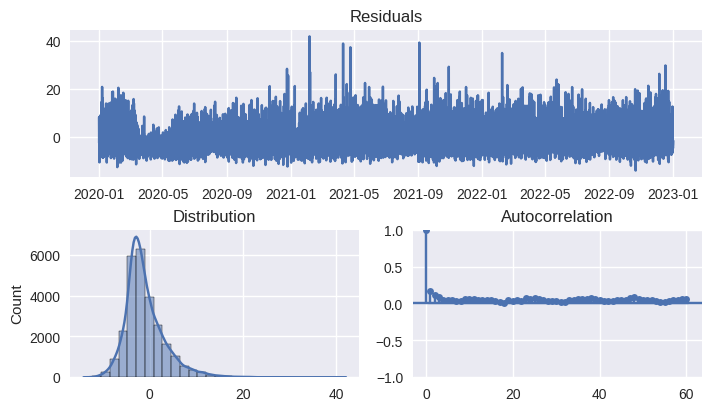

In [ ]:
# Distribución residuos Out-sample
print(pd.Series(np.where(residuos < 0, 'negative', 'positive')).value_counts())
plt.rcParams.update({'font.size': 8})
_ = plot_residuals(residuals=residuos, figsize=(7, 4))

In [ ]:
# Almacenar residuos out-sample en el forecaster
forecaster.set_out_sample_residuals(
    residuals = residuos,
    y_pred    = accidentes_df.loc[predicciones_val.index, 'NUM_ACCIDENTES']
)

In [ ]:
# Backtest con intervalos de predicción para el conjunto de test utilizando los
metrica, predicciones = backtesting_forecaster(
                            forecaster          = forecaster,
                            y                   = accidentes_df['NUM_ACCIDENTES'],
                            exog                = accidentes_df[exog_seleccionadas],
                            steps               = 24,
                            metric              = 'mean_absolute_error',
                            initial_train_size  = len(accidentes_df.loc[:fin_val]),
                            refit               = False,
                            interval            = [10, 90],
                            n_boot              = 250,
                            in_sample_residuals = False, # Se utilizan los residuos out-sample
                            binned_residuals    = True, # Residuos condicionados a los valores predichos
                            n_jobs              = 'auto',
                            verbose             = False,
                            show_progress       = True
                        )
predicciones.head(5)

  0%|          | 0/365 [00:00<?, ?it/s]

,pred,lower_bound,upper_bound
2023-01-01 00:00:00,3.058229,-1.550087,6.180658
2023-01-01 01:00:00,2.540699,-1.409393,5.481316
2023-01-01 02:00:00,2.031247,-2.654681,4.775583
2023-01-01 03:00:00,2.224872,-1.866091,6.395754
2023-01-01 04:00:00,1.913770,-2.299536,5.560904


In [ ]:
fig = go.Figure([
    go.Scatter(
        name='Predicción',
        x=predicciones.index,
        y=predicciones['pred'],
        mode='lines',
    ),
    go.Scatter(
        name='Valor real',
        x=datos_test.index,
        y=datos_test['NUM_ACCIDENTES'],
        mode='lines',
    ),
    go.Scatter(
        name='Upper Bound',
        x=predicciones.index,
        y=predicciones['upper_bound'],
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=predicciones.index,
        y=predicciones['lower_bound'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
])
fig.update_layout(
    title="Predicción con intervalos de confianza vs valor real",
    xaxis_title="Fecha",
    yaxis_title="Demanda (MWh)",
    width=800,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    hovermode="x",
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

In [ ]:

fin_val = pd.to_datetime(fin_val)

pred_index_start = predicciones.index[0]

accidentes_post_fin_val = accidentes_df.loc[pred_index_start:, 'NUM_ACCIDENTES']

dentro_intervalo = np.where(
    (accidentes_post_fin_val >= predicciones['lower_bound']) & \
    (accidentes_post_fin_val <= predicciones['upper_bound']),
    True,
    False
)

cobertura = np.mean(dentro_intervalo)
area = (predicciones['upper_bound'] - predicciones['lower_bound']).sum()

print(f"Área total del intervalo: {round(area, 2)}")
print(f"Cobertura del intervalo predicho: {round(100 * cobertura, 2)}%")


Área total del intervalo: 68773.08
Cobertura del intervalo predicho: 64.72%
